#Importar Liberías

In [3]:
import numpy as np                  # Manejo de arreglos (álgebra lineal en Python)
import pandas as pd                 # Manejo de Dataframes (tipo de datos)
import matplotlib.pyplot as plt     # Gráficas
import seaborn as sns               # Gráficas estadísticas (histogramas)

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [5]:
from pylab import *; import os

folder='/content/drive/MyDrive/EA25_Euclidiana'
os.makedirs(folder,exist_ok=True)

#Funciones Vizualización

In [6]:
def graficar_clusters_PCA2D(clusters, metodo, centroids):
    # Crear un gráfico de dispersión 2D usando las dos primeras componentes principales obtenidas de PCA.
    plt.figure(figsize=(10, 6))  # Define el tamaño de la figura del gráfico.

    # Crea un gráfico de dispersión utilizando seaborn para las dos primeras componentes principales (X_pca).
    # 'hue=clusters' asigna un color diferente a cada cluster.
    # 'palette='viridis'' define la paleta de colores a utilizar.
    # 'alpha=0.6' establece la transparencia de los puntos.
    # 's=100' establece el tamaño de los puntos en el gráfico.
    # 'edgecolor='black'' añade un borde negro alrededor de los puntos.
    sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1],
                    hue=clusters, palette='cool',
                    alpha=0.6, s=100, edgecolor='black')

    # Agrega los centroides de los clusters al gráfico.
    # 'centroids[:,0]' y 'centroids[:,1]' son las coordenadas de los centroides.
    # 'c='black'' establece el color de los centroides en negro.
    # 's=100' establece el tamaño de los centroides en el gráfico.
    plt.scatter(centroids[:, 0], centroids[:, 1], c='black', s=100, label='centroides')

    # Establece el título del gráfico, que incluye el método de clustering.
    plt.title(f'Visualización 2D de la Clusterización (PCA) {metodo}', fontsize=16)

    # Etiqueta el eje x como 'Componente Principal 1'.
    plt.xlabel('Componente Principal 1')
    # Etiqueta el eje y como 'Componente Principal 2'.
    plt.ylabel('Componente Principal 2')

    # Activa la cuadrícula en el gráfico para facilitar la lectura.
    plt.grid(True)
    plt.grid(linestyle='-', alpha=0.5) # Define el estilo y la transparencia de la cuadrícula.

    # Añade una leyenda que identifica los clusters.
    plt.legend(title='Cluster')

    # Muestra el gráfico generado.
    plt.show()


In [7]:
# Importamos Axes3D para habilitar gráficos en 3D con Matplotlib
from mpl_toolkits.mplot3d import Axes3D

def graficar_clusters_PCA3D(clusters, metodo, centroids):
    # Crear una figura para el gráfico 3D
    fig = plt.figure(figsize=(10, 8))  # Define el tamaño de la figura
    ax = fig.add_subplot(111, projection='3d')  # Añade un gráfico 3D al subplot

    # Graficar los puntos en 3D con un borde negro
    # X_pca contiene los datos proyectados en las 3 primeras componentes principales (PCA)
    # 'clusters' define el color de cada punto según su cluster
    # 'cmap' selecciona el mapa de colores 'viridis'
    # 's' define el tamaño de los puntos y 'alpha' su transparencia
    # 'edgecolor' añade un borde negro a cada punto
    ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2],
               c=clusters, cmap='cool', s=100, alpha=0.6, edgecolor='black')

    # Graficar los centroides de cada cluster en negro
    # Los centroides son los puntos centrales de cada cluster
    ax.scatter(centroids[:, 0], centroids[:, 1], centroids[:, 2],
               c='black', s=150, label='centroides', edgecolor='black')

    # Añadir etiquetas de los ejes y el título del gráfico
    ax.set_title(f'Visualización 3D de la Clusterización (PCA) {metodo}', fontsize=16)  # Título que incluye el método de clustering
    ax.set_xlabel('Componente Principal 1')  # Etiqueta para el eje X
    ax.set_ylabel('Componente Principal 2')  # Etiqueta para el eje Y
    ax.set_zlabel('Componente Principal 3')  # Etiqueta para el eje Z

    # Configurar leyenda para identificar los clusters y activar la cuadrícula
    ax.legend(title='Cluster')  # Añade una leyenda con el título 'Cluster'
    ax.grid(True, linestyle='-', alpha=0.5)  # Activa la cuadrícula con líneas suaves

    # Mostrar el gráfico 3D
    plt.show()  # Renderiza el gráfico en la pantalla

#Tratamiento de Datos

In [8]:
url2 = 'https://docs.google.com/spreadsheets/d/e/2PACX-1vQ8rexwHWqaTApMVcLue-a2vLViUVWS17XyI_krCCRm7PwKEWkn00x_PCs2V6go3r5PYMuRVitf2w6x/pub?output=csv'
data = pd.read_csv (url2)#Carga el archivo csv como DataFrame (arreglo de datos con filas y columnas)
data.head()#muestra los primeras 5 posiciones
data.tail()#muestra las ultimas 5 posiciones

,Name,OVR,PAC,SHO,PAS,DRI,DEF,PHY,Acceleration,Sprint Speed,...,Skill moves,Age,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes,Preferred foot,Nation,Position
17732,Araya Dennis,53,42,57,49,52,25,42,44,41,...,2,18,NaN,NaN,NaN,NaN,NaN,Right,England,ST
17733,Alexia Férnandez,53,53,55,51,53,34,47,52,53,...,2,22,NaN,NaN,NaN,NaN,NaN,Right,Spain,LW
17734,Aleigh Gambone,53,60,58,53,56,49,53,58,62,...,4,23,NaN,NaN,NaN,NaN,NaN,Right,United States,CM
17735,Joy Lysser,53,61,52,48,56,53,58,60,62,...,2,20,NaN,NaN,NaN,NaN,NaN,Left,Switzerland,CM
17736,Kateřina Vithová,53,60,49,53,54,27,55,59,60,...,3,18,NaN,NaN,NaN,NaN,NaN,Left,Czech Republic,LM


In [9]:
data.shape# Devuelve el número de filas y columnas del DataFrame 'data' en forma de tupla (filas, columnas).

(17737, 48)

In [10]:
#Imputar datos faltantes para las categorías de GK cambiando NaN por 0

gk_columns = ['GK Diving', 'GK Handling', 'GK Kicking', 'GK Positioning', 'GK Reflexes']# Lista de columnas específicas que corresponden a atributos de porteros (GK: Goalkeeper)
data[gk_columns] = data[gk_columns].fillna(0)# Esto asegura que no haya valores faltantes en estas columnas y evita posibles errores en el análisis.

In [11]:
### Ahora extraeremos los datos

# 'iloc[:,-1]' selecciona todas las filas (:) de la última columna (-1).
# 'values' convierte esta selección en un array NumPy.
X = data.iloc[:, 1:-1].values

# 'iloc[:,-1]' selecciona todas las filas (:) de la última columna (-1).
# 'values' convierte esta selección en un array NumPy.
y = data.iloc[:,-1].values# Muestra los valores de 'y' (la variable objetivo o dependiente).
y# Muestra los valores de 'y' (la variable objetivo o dependiente)

array(['ST', 'CDM', 'ST', ..., 'CM', 'CM', 'LM'], dtype=object)

In [12]:
X #muestra los valores de 'x'

array([[91, 97, 90, ..., 0.0, 'Right', 'France'],
       [91, 66, 80, ..., 0.0, 'Right', 'Spain'],
       [91, 88, 92, ..., 0.0, 'Left', 'Norway'],
       ...,
       [53, 60, 58, ..., 0.0, 'Right', 'United States'],
       [53, 61, 52, ..., 0.0, 'Left', 'Switzerland'],
       [53, 60, 49, ..., 0.0, 'Left', 'Czech Republic']], dtype=object)

In [13]:
### Codificar el pie preferido como variable numérica

from sklearn.preprocessing import LabelEncoder# Importa la clase LabelEncoder de sklearn para codificar etiquetas de categorías en números.
le = LabelEncoder()# Crear una instancia del codificador


X[:, -2] = le.fit_transform(X[:, -2])  # Codificar la penúltima columna (Preferred Foot)

X[:, -1] = le.fit_transform(X[:, -1])  # Codificar la penúltima columna (Preferred Foot)

print(X[:, -2:])  # Imprimir las últimas dos columnas para verificar la codificación

[[1 50]
 [1 128]
 [0 106]
 ...
 [1 146]
 [0 135]
 [0 37]]


In [14]:
df = pd.DataFrame(X)# Crea un DataFrame a partir del array X.
for col in df.columns:# Itera sobre cada columna del DataFrame 'df'.

    df[col] = pd.to_numeric(df[col], errors='coerce') # Convertir a numérico, forzando errores a NaN

In [15]:
X = df.values # Convierte el DataFrame 'df' nuevamente a un array de NumPy.
X # Muestra los valores de 'X', que ahora es un array NumPy con los datos del DataFrame.

array([[ 91.,  97.,  90., ...,   0.,   1.,  50.],
       [ 91.,  66.,  80., ...,   0.,   1., 128.],
       [ 91.,  88.,  92., ...,   0.,   0., 106.],
       ...,
       [ 53.,  60.,  58., ...,   0.,   1., 146.],
       [ 53.,  61.,  52., ...,   0.,   0., 135.],
       [ 53.,  60.,  49., ...,   0.,   0.,  37.]])

In [16]:
from sklearn.impute import SimpleImputer# Importa la clase SimpleImputer de sklearn para manejar valores faltantes (NaN).

# Crea una instancia de SimpleImputer para reemplazar valores faltantes.
# 'missing_values=np.nan' indica que los valores faltantes son representados como NaN.
# 'strategy="median"' indica que los valores faltantes serán reemplazados por la mediana de cada columna.
imputer = SimpleImputer(missing_values=np.nan, strategy='median')

imputer.fit(X)# Ajusta el imputer a los datos en 'X', es decir, calcula la mediana de cada columna.

X = imputer.transform(X)# Aplica la transformación a 'X', reemplazando los valores faltantes con la mediana correspondiente.

# Crea una nueva variable 'X_' que contiene todas las columnas de 'X' excepto la última.
# Esto es útil si deseas separar las características de la variable objetivo.
X_ = X[:,:-1]

In [17]:
from sklearn.cluster import KMeans# Importa la clase KMeans del módulo sklearn.cluster para realizar la agrupación (clustering).

# Crea una instancia del modelo KMeans con 4 clusters (grupos).
# 'n_clusters=4' define el número de clusters que queremos identificar.
# 'random_state=42' asegura que los resultados sean reproducibles al fijar la semilla aleatoria.
kmeans=KMeans(n_clusters=4, random_state=42)

# Ajusta el modelo KMeans a los datos en X_ (que contiene las características) y predice a qué cluster pertenece cada punto.
# 'fit_predict()' ajusta el modelo y asigna cada punto de datos a uno de los 4 clusters.
clusters=kmeans.fit_predict(X_)

In [18]:
# Obtiene las coordenadas de los centroides de los clusters formados por KMeans.
# 'cluster_centers_' devuelve un array que contiene las coordenadas de los centros de cada uno de los clusters.
centroides_kmeans = kmeans.cluster_centers_

centroides_kmeans# Muestra los centroides obtenidos.

array([[ 6.58039639e+01,  7.30671115e+01,  6.27686421e+01,
         5.75673077e+01,  6.65661303e+01,  3.32148744e+01,
         6.03475275e+01,  7.31840659e+01,  7.29531005e+01,
         6.43479199e+01,  6.40657378e+01,  6.51361852e+01,
         5.94497645e+01,  5.62496075e+01,  5.93618524e+01,
         5.92382261e+01,  5.41350078e+01,  4.98153454e+01,
         6.19599686e+01,  5.27468603e+01,  5.55781005e+01,
         6.64729199e+01,  7.11840659e+01,  6.95837912e+01,
         6.15011774e+01,  6.63779435e+01,  6.07388148e+01,
         2.95282575e+01,  5.47343014e+01,  3.09636970e+01,
         3.19097331e+01,  2.92580455e+01,  6.61291209e+01,
         6.34425039e+01,  6.21283359e+01,  5.04640895e+01,
         3.12715856e+00,  2.87519623e+00,  2.47327316e+01,
         1.58983937e-13,  9.32587341e-14,  6.15507645e-13,
         3.38395978e-13, -2.94875235e-13,  7.87284144e-01],
       [ 6.54262131e+01,  6.58829415e+01,  6.39144572e+01,
         6.30215108e+01,  6.67453727e+01,  3.58204102e+

In [19]:
data['Cluster'] = clusters# Añadir los clusters al DataFrame original

print(data[['Name', 'Nation', 'Cluster']].head())  # Muestra los primeros resultados

              Name   Nation  Cluster
0    Kylian Mbappé   France        0
1            Rodri    Spain        3
2   Erling Haaland   Norway        3
3  Jude Bellingham  England        3
4         Vini Jr.   Brazil        0


In [20]:
from sklearn.decomposition import PCA # Importa la clase PCA del módulo sklearn.decomposition para realizar la reducción de dimensionalidad.

# Crear un objeto PCA y ajustar los datos
pca = PCA(n_components=3)  # Queremos las tres primeras componentes principales

# Ajusta el modelo PCA a los datos en 'X_' y transforma los datos en un nuevo espacio con 3 componentes principales.
# 'fit_transform()' ajusta el modelo PCA a los datos y transforma 'X_' en un conjunto de datos con 3 dimensiones.
X_pca = pca.fit_transform(X_)

In [21]:
# Obtiene la proporción de varianza explicada por cada una de las componentes principales.
# 'explained_variance_ratio_' devuelve un array donde cada valor es el porcentaje de varianza explicada por cada componente
varianza =  pca.explained_variance_ratio_

# Suma el porcentaje de varianza explicada por las tres primeras componentes principales y lo imprime.
# Esto indica cuánta de la varianza total de los datos está siendo capturada por estas tres componentes.
print(sum(varianza))

0.839709399866017


#Implementación Manual Distancia Euclideana

In [22]:
import random as random # Importa el módulo 'random', que proporciona funciones para generar números aleatorios.

In [23]:
# Definimos la distancia euclídea
def distancia_euclidiana(x, c):
    # Calcula la distancia euclidiana entre dos puntos x y c
    return np.sqrt(np.sum((x - c) ** 2))

# Variables de inicialización
# Paso 1: Número de clusters
k = 4  # Número de clusters, determinado por heurística y el método del codo

# Paso 2: Elección de centroides
dimension = X_.shape[0]  # Número de puntos (filas de X_)
centroids = X_[random.sample(range(dimension), k)]  # Selecciona k puntos aleatorios de X_ como centroides iniciales
centroids  # Muestra los centroides iniciales


# Almacenamiento de etiquetas de los clusters
clusters_manuales = np.zeros(dimension)  # Array para almacenar a qué cluster pertenece cada punto

# Almacenamiento de distancias
distancias = np.zeros((dimension, k))  # Matriz para almacenar la distancia de cada punto a cada centroide

# Paso 3: Implementación del método de K-means y criterios de convergencia
tol = 1e-6  # Tolerancia para la convergencia (cuando los centroides dejen de moverse)
error = 100  # Inicializar un error grande para comenzar el bucle
id_img=0
# Repetir hasta que los centroides dejen de moverse significativamente
while error > tol:
    # Asignación de puntos a los clusters más cercanos
    for i in range(dimension):  # Iterar sobre las filas (cada punto)
        for j in range(k):  # Iterar sobre las columnas (cada centroide)
            # Calcular la distancia entre el punto i y el centroide j
            distancias[i, j] = distancia_euclidiana(X_[i], centroids[j])
        # Asignar el punto i al cluster cuyo centroide esté más cerca
        clusters_manuales[i] = np.argmin(distancias[i])


    clusters_grafica_eu=clusters_manuales.astype(int)
    centroids_eu = np.array(centroids)
    centroids_pca = pca.transform(centroids_eu)

    # GENERACION IMAGENES VIDEO

###########################  ###########################  ###########################  ###########################
    plt.ioff() #No mostrar la imágenes
    plt.figure(figsize=(12, 8))
    sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1],
                    hue=clusters_grafica_eu, palette='cool',
                    alpha=0.6, s = 100)

    plt.scatter(centroids_pca[:,0], centroids_pca[:,1],
                c= 'black', s = 100, label = 'centroides')


    plt.title(f'Visualización 2D de la Clusterización (PCA) K-means Euclidiana Manual', fontsize=16)

    plt.xlabel('Componente Principal 1')
    plt.ylabel('Componente Principal 2')
    plt.grid(True)
    plt.grid(linestyle = '-', alpha  = 0.5)
    plt.legend(title='Cluster')
    plt.savefig(folder+'/figura{:0>5}.jpg'.format(id_img))

###########################  ###########################  ###########################  ###########################

    # Almacenar los centroides previos antes de actualizarlos
    centroids_prev = np.copy(centroids)

    # Actualizar centroides
    for l in range(k):  # Iteramos sobre los clusters (k = 4)
        # Obtenemos los puntos asignados al cluster l
        puntos_cluster = X_[clusters_manuales == l]
        # Si el cluster no está vacío, recalculamos el centroide como la media de los puntos
        if len(puntos_cluster) > 0:
            centroids[l] = np.mean(puntos_cluster, axis=0)
        else:
            # Si el cluster está vacío, reasignar un nuevo centroide aleatoriamente
            print(f'cluster {l} vacío, reasignando centroide aleatoriamente')
            centroids[l] = X_[np.random.choice(dimension)]

    # Calcular el error como el promedio del cambio en la posición de los centroides
    error = np.mean([distancia_euclidiana(centroids[l], centroids_prev[l]) for l in range(k)])

    # Imprimir el error en cada iteración
    print(error)
    id_img=id_img+1






51.307898679564836
41.552002550352654
30.69171931599832
8.472548502532018
2.532892081554872
1.1570212913759708
0.6426004312360711
0.44248201715393837
0.27523984372243876
0.21485218137997458
0.14609477821822014
0.1059748310995807
0.07525766066133907
0.06437543610109381
0.0322379207133835
0.026426041461173777
0.024373558670374433
0.020117160420174234
0.0


#Visualización Distancia Euclidiana Manual

In [24]:
# Animación
from matplotlib import animation
from IPython.display import HTML
import cv2; import os
import warnings

folder='/content/drive/MyDrive/EA25_Euclidiana'
os.makedirs(folder,exist_ok=True) #Revisa si ya existe la carpeta

fig= plt.figure(figsize=(12, 8)); plt.axis('off');ims=[]  # fig= figura que se genera, axis=QUitar ejes, ims=genera lista de imagenes

for i in range(0,id_img+1,1):    # desde cero hasta la ultima imagen range(inicio,fin,paso)
  filename= os.path.join(folder+"/figura{:0>5}.jpg".format(i))  # Busca en la carpeta las imgs una por una en el drive
  img= cv2.imread(filename) #Leer el archivo
  if img is not None: # Mirar si está la imagen
    im= plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB), animated=True)#cv2 es la liberia del video, a color y animada
    ims.append([im])#Agrega la imagen a la lista
  else:
    print(f"No se encontró la imagen: {filename}") # Print an error message if the image cannot be loaded

#HAcer la animación
ani= animation.ArtistAnimation(fig, ims, interval=200, blit=True, repeat_delay=1000)#El blit sive para optimizar las animaciones suavizando el salto entre imagenes, repeat delay nos dice la espera para repetir la img en ms,interval cuanto tarda de pasar d ela img 1 a la img 2
writer= animation.FFMpegWriter(fps=40, bitrate=1800)#FFMpeg=Motor del video(el que precesa el video), Velocidad del video,bitrate=cantidad de datos transmitidos por kbits por segundo
video_path= os.path.join(folder,"VideoL1.mp4")#Dónde y como se va a guardar
plt.rcParams['animation.embed_limit'] = 25  # Aumenta el límite a 25 MB (o el valor deseado)
ani.save(video_path, writer=writer)#Guarda la animación del video y los datos en writer con el motor de video (para que no sea un gif)
HTML(ani.to_jshtml())#direccion donde se guarda el video para correr el video en el notebook

In [25]:
clusters_manuales=clusters_manuales.astype(int)# Convertir el array 'clusters_manuales' a tipo entero

In [26]:
centroids=np.array(centroids)# Convertir los centroides a un array de NumPy
centroids=pca.transform(centroids)# Transformar los centroides usando el modelo PCA

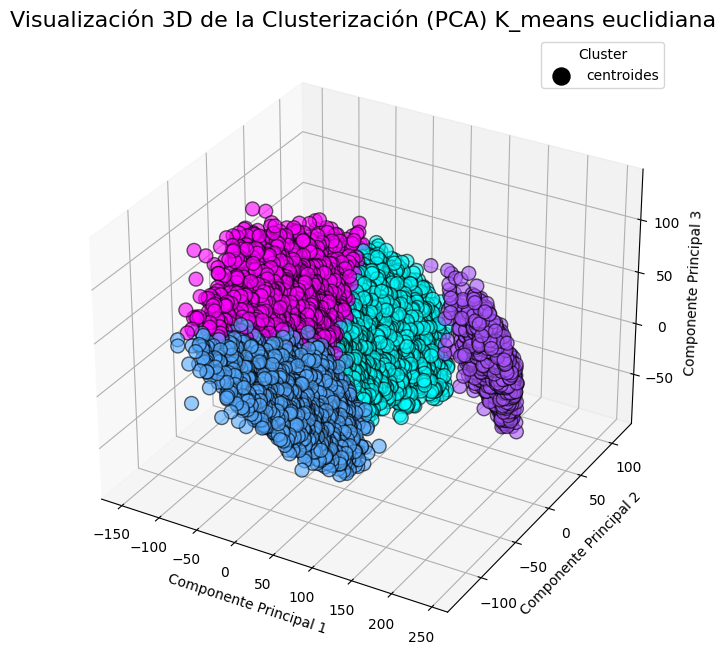

In [28]:
manual_3D=graficar_clusters_PCA3D(clusters_manuales, 'K_means euclidiana',centroids)# Llamada a la función graficar_clusters_PCA3D para visualizar los clusters en 3D
manual_3D #muestra la gráfica en la función